In [1]:
import os
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input, VGG16
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

with open("/kaggle/input/pklaivent/Gambar Aiventure/Kmeans_model.pkl", "rb") as f:
    kmeans = pickle.load(f)

with open("/kaggle/input/pklaivent/Gambar Aiventure/VGG16_model.pkl", "rb") as f:
    feature_extractor = pickle.load(f)

with open("/kaggle/input/pklaivent/Gambar Aiventure/PCA_model.pkl", "rb") as f:
    pca = pickle.load(f)

with open("/kaggle/input/pklaivent/Gambar Aiventure/tourism_features.pkl", "rb") as f:
    features_dict = pickle.load(f)

In [2]:
def extract_features(image_path, model):
    try:
        img = load_img(image_path, target_size=(224, 224))
        img_array = img_to_array(img)
        reshaped_img = img_array.reshape(1, 224, 224, 3)
        img_preprocessed = preprocess_input(reshaped_img)
        features = model.predict(img_preprocessed)
        return features
    except Exception as e:
        print(f"Error extracting features from {image_path}: {e}")
        return None

In [3]:
def show_recommended_images(input_image, recommended_images, input_cluster):
    plt.figure(figsize=(45, 15))
    input_img = mpimg.imread(input_image)
    plt.subplot(1, len(recommended_images) + 1, 1)
    plt.imshow(input_img)
    plt.axis('off')
    plt.title(f"Input Image\n(Cluster: {input_cluster})") 
    
    for i, img_path in enumerate(recommended_images):
        recommended_img = mpimg.imread(img_path)
        plt.subplot(1, len(recommended_images) + 1, i + 2)
        plt.imshow(recommended_img)
        plt.axis('off')
        plt.title(f"Recommendation {i + 1}")
    
    plt.show()

In [4]:
# Fungsi untuk memberikan rekomendasi gambar
def recommend_images(input_image, feature_extractor, features_dict, kmeans, pca, n_recommendations=7):
    # Ekstraksi fitur dari gambar input
    input_features = extract_features(input_image, feature_extractor)
    if input_features is None:
        print("Error: Tidak dapat mengekstrak fitur dari gambar input.")
        return [], None

    # Transformasi fitur dengan PCA
    input_features_pca = pca.transform(input_features)
    
    # Prediksi klaster input
    input_cluster = kmeans.predict(input_features_pca)[0]
    
    # Ambil gambar yang termasuk dalam klaster input
    cluster_images = [img_path for img_path, cluster in zip(features_dict.keys(), kmeans.labels_) if cluster == input_cluster]
    
    # Hitung jarak antar fitur gambar dalam klaster untuk rekomendasi
    cluster_features = [features_dict[img].squeeze() for img in cluster_images]
    cluster_features_pca = pca.transform(cluster_features)
    distances = np.linalg.norm(cluster_features_pca - input_features_pca, axis=1)
    recommended_indices = np.argsort(distances)[:n_recommendations]
    
    # Ambil rekomendasi gambar
    recommendations = [cluster_images[i] for i in recommended_indices]
    return recommendations, input_cluster

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


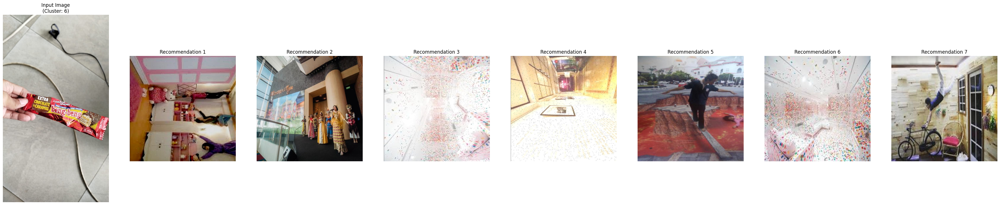

In [6]:
# Tes fungsi rekomendasi
input_image = "/kaggle/input/bengbeng/WhatsApp Image 2024-11-19 at 12.14.07_45c74ca0.jpg"
recommended_images, input_cluster = recommend_images(input_image, feature_extractor, features_dict, kmeans, pca)

# Tampilkan gambar yang direkomendasikan
show_recommended_images(input_image, recommended_images, input_cluster)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


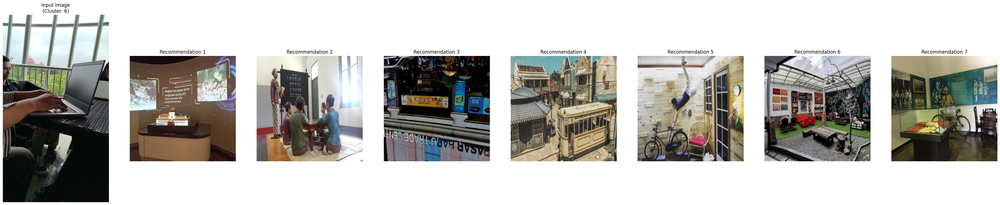

In [7]:
# Tes fungsi rekomendasi
input_image = "/kaggle/input/random/WhatsApp Image 2024-11-19 at 11.36.19_f0a0fe00.jpg"
recommended_images, input_cluster = recommend_images(input_image, feature_extractor, features_dict, kmeans, pca)

# Tampilkan gambar yang direkomendasikan
show_recommended_images(input_image, recommended_images, input_cluster)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


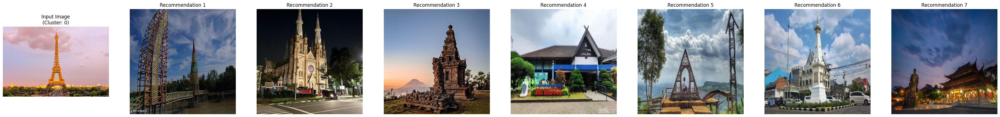

In [8]:
# Tes fungsi rekomendasi
input_image = "/kaggle/input/ujicoba/Eifell.jpg"
recommended_images, input_cluster = recommend_images(input_image, feature_extractor, features_dict, kmeans, pca)

# Tampilkan gambar yang direkomendasikan
show_recommended_images(input_image, recommended_images, input_cluster)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


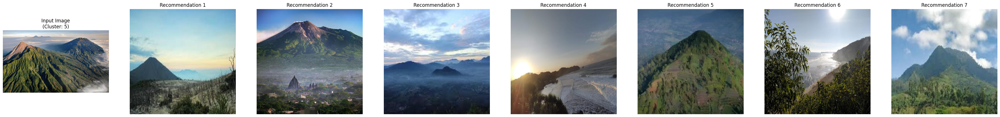

In [9]:
# Tes fungsi rekomendasi
input_image = "/kaggle/input/gunung/gunung.jpg"
recommended_images, input_cluster = recommend_images(input_image, feature_extractor, features_dict, kmeans, pca)

# Tampilkan gambar yang direkomendasikan
show_recommended_images(input_image, recommended_images, input_cluster)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


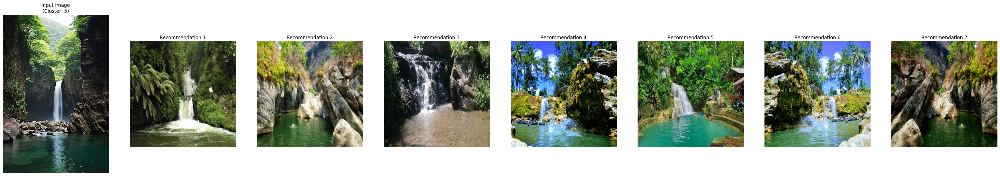

In [10]:
# Tes fungsi rekomendasi
input_image = "/kaggle/input/update/airterjun.jpg"
recommended_images, input_cluster = recommend_images(input_image, feature_extractor, features_dict, kmeans, pca)

# Tampilkan gambar yang direkomendasikan
show_recommended_images(input_image, recommended_images, input_cluster)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


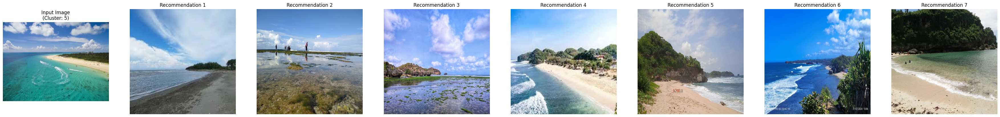

In [11]:
# Tes fungsi rekomendasi
input_image = "/kaggle/input/update/pantai.webp"
recommended_images, input_cluster = recommend_images(input_image, feature_extractor, features_dict, kmeans, pca)

# Tampilkan gambar yang direkomendasikan
show_recommended_images(input_image, recommended_images, input_cluster)